In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,classification_report,roc_auc_score,confusion_matrix,roc_curve,auc
from sklearn import preprocessing
from warnings import filterwarnings
import os
import cv2

# IGNORING UNNECESSARRY WARNINGS

filterwarnings("ignore",category=DeprecationWarning)
filterwarnings("ignore", category=FutureWarning) 
filterwarnings("ignore", category=UserWarning)

# Import and Shuffle the dataset

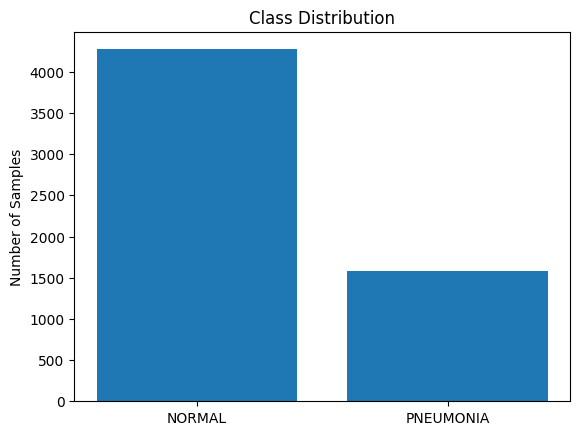

In [4]:
classes = {'NORMAL':0, 'PNEUMONIA':1}
folders = ['test','train','val']

import random

# data set
data_x = []
data_y = []

# We will use this dataset for visualizing in test prediction
test_x = []
test_y = []

data = []

for folder in folders:
    for cls in classes:
        pth = f'../input/chest-xray-pneumonia/chest_xray/{folder}/{cls}'
        for j in os.listdir(pth):
            img = cv2.imread(pth + '/' + j, 0)
            img = cv2.resize(img, (200, 200))
            data.append((img, classes[cls]))
    
# Shuffle the data for the current class
random.shuffle(data)

# Define the class names
class_names = ['NORMAL', 'PNEUMONIA']

# Count the number of samples in each class
class_counts = {}
for _, cls in data:
    if cls in class_counts:
        class_counts[cls] += 1
    else:
        class_counts[cls] = 1

# Plot the bar chart
plt.bar(class_names, class_counts.values())
plt.ylabel('Number of Samples')
plt.title('Class Distribution')
plt.show()

# Balance the dataset

Balanced Class Distribution: {0: 4273, 1: 4273}


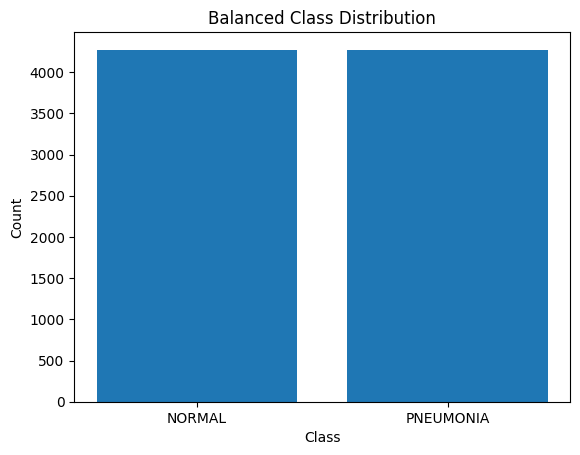

In [5]:
from imblearn.over_sampling import SMOTE

# Split the data into train and test sets
images, labels = zip(*data)

# Convert images and labels to numpy arrays
images = np.array(images)
labels = np.array(labels)

# Flatten the image data
flattened_images = images.reshape(images.shape[0], -1)

# Create an instance of SMOTE
smote = SMOTE()

# Apply SMOTE to generate synthetic samples
oversampled_images, oversampled_labels = smote.fit_resample(flattened_images, labels)

# Reshape the flattened images back to the original shape
oversampled_images = oversampled_images.reshape(oversampled_images.shape[0], images.shape[1], images.shape[2])

# Check the balanced class distribution
unique, counts = np.unique(oversampled_labels, return_counts=True)
balanced_class_distribution = dict(zip(unique, counts))
print("Balanced Class Distribution:", balanced_class_distribution)

images = oversampled_images
labels = oversampled_labels
# Plot the balanced class distribution
plt.bar(class_names, balanced_class_distribution.values())
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Balanced Class Distribution')
plt.show()

In [6]:
data_images, test_images, data_labels, test_labels = train_test_split(images, labels, test_size=0.01, random_state=42)

# Append the shuffled data,test to the main lists
data_x.extend(data_images)
data_y.extend(data_labels)

test_x.extend(test_images)
test_y.extend(test_labels)
    

print('Data set size : ',len(data_x))
print('Test set size : ',len(test_x))

Data set size :  8460
Test set size :  86


# Prepare data

In [7]:
data_x = np.array(data_x)
data_y = np.array(data_y)

data_x_updated = data_x.reshape(len(data_x), -1)
data_x_updated.shape

xtrain, xtest, ytrain, ytest = train_test_split(data_x_updated, data_y, random_state=10,
                                               test_size=.20)
xtrain.shape, xtest.shape

((6768, 40000), (1692, 40000))

## Feature Scaling

In [8]:
# AS we can see, x_train & x_test are not scale
print(xtrain.max(), xtrain.min())

# Scaling the dataset
scaler = preprocessing.MinMaxScaler()
xtrain = scaler.fit_transform(xtrain)
xtest = scaler.fit_transform(xtest)

255 0


# Drawing metrics function

In [9]:
def plot_metrics(ytest,pred):
    
    # Compute confusion matrix
    cm = confusion_matrix(ytest, pred)

    # Compute classification report
    report = classification_report(ytest, pred)
    #  report
    print('\n',report,'\n','_'*230,'\n\n')


    # Compute ROC curve
    fpr, tpr, thresholds = roc_curve(ytest, pred)
    roc_auc = auc(fpr, tpr)

    # Plot confusion matrix, classification report, and ROC curve
    plt.figure(figsize=(15, 5))

    # Plot confusion matrix
    plt.subplot(1, 2, 2)
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
    plt.title("Confusion Matrix", {'fontsize': 20},y=1.3)
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")

    # Plot ROC curve
    plt.subplot(1, 2, 1)
    plt.plot(fpr, tpr, color='b', label='ROC curve (AUC = {:.2f})'.format(roc_auc))
    plt.plot([0, 1], [0, 1], color='r', linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC)', {'fontsize': 20},y=1.3)
    plt.legend(loc="lower right")

    plt.tight_layout()
    plt.show()

# Showing testing proccess visually

In [10]:
def show_testing(test_x,test_y,method):
    fig, axes = plt.subplots(nrows=6,
                             ncols=5,
                             figsize=(20, 25),
                            subplot_kw={'xticks': [], 'yticks': []})

    for i, ax in enumerate(axes.flat):   
           img1 = test_x[i].reshape(1,-1)/255
           p = method.predict(img1)
           ax.imshow(test_x[i],cmap='gray')
           ax.set_title(f"PREDICTION:{class_names[p[0]]}\n Actual result:{class_names[test_y[i]]}")

# **Logisitic Regression**

## Training

In [11]:
from sklearn.linear_model import LogisticRegression

import warnings
warnings.filterwarnings('ignore')

# Training the dataset
lg = LogisticRegression(C=0.1)
lg.fit(xtrain, ytrain)


# Prediction
pred = lg.predict(xtest)

## Confusion matrix , Classification Report , ROC Curves


               precision    recall  f1-score   support

           0       0.95      0.84      0.90       863
           1       0.86      0.96      0.90       829

    accuracy                           0.90      1692
   macro avg       0.90      0.90      0.90      1692
weighted avg       0.91      0.90      0.90      1692
 
 ______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 




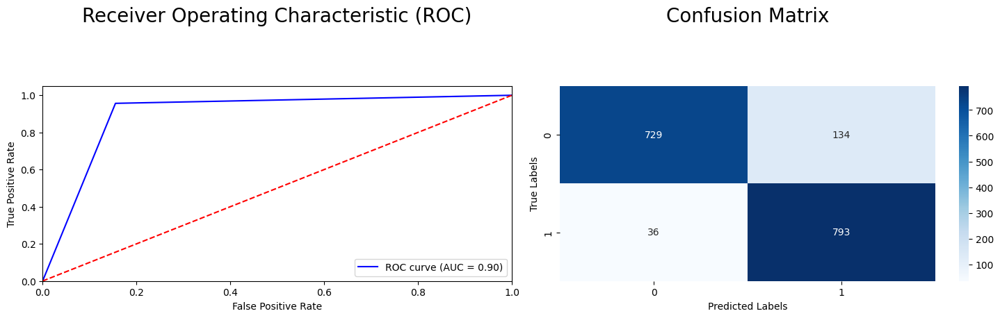

In [12]:
plot_metrics(ytest,pred)

## Visualize the proccess

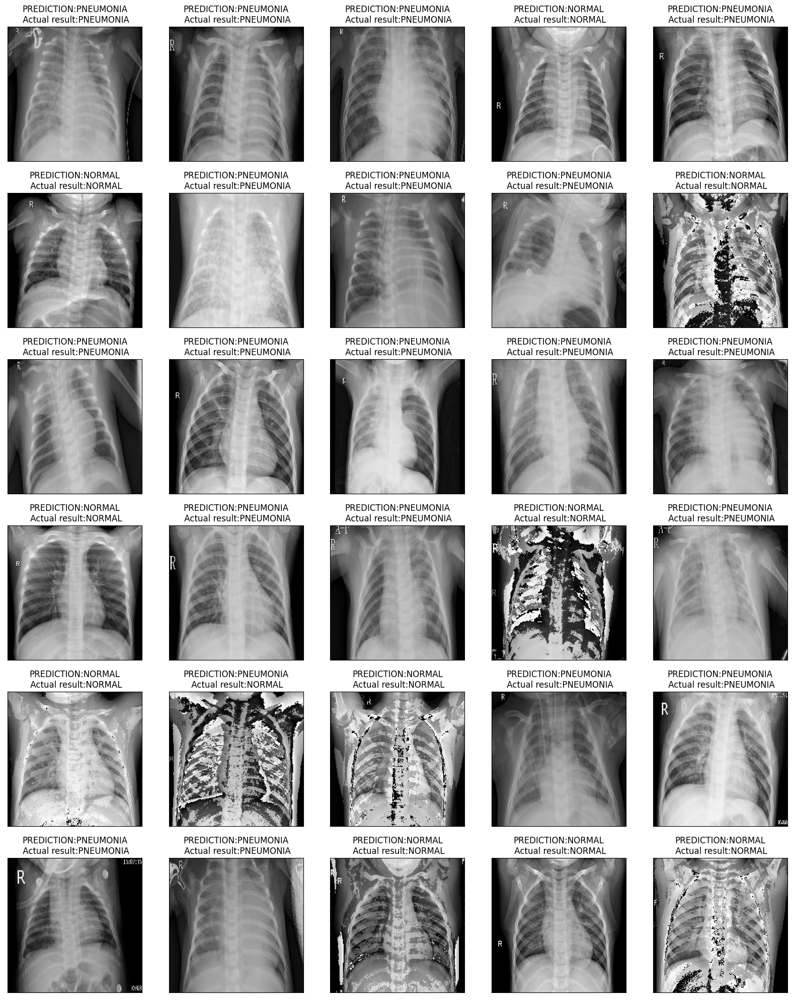

In [13]:
show_testing(test_x,test_y,lg)

# **SVC Model**

## Training and getting report

In [14]:
from sklearn.svm import SVC

# Training the dataset
sv = SVC()
sv.fit(xtrain, ytrain)

# Evaluation
print("Training Score:", sv.score(xtrain, ytrain))
print("Testing Score:", sv.score(xtest, ytest))

# Prediction
pred = sv.predict(xtest)

Training Score: 0.9747340425531915
Testing Score: 0.9621749408983451


## Confusion matrix , Classification Report , ROC Curves


               precision    recall  f1-score   support

           0       0.97      0.95      0.96       863
           1       0.95      0.97      0.96       829

    accuracy                           0.96      1692
   macro avg       0.96      0.96      0.96      1692
weighted avg       0.96      0.96      0.96      1692
 
 ______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 




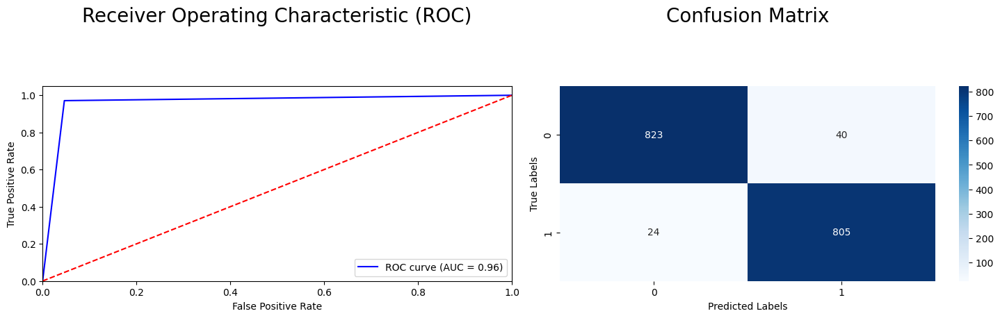

In [15]:
plot_metrics(ytest,pred)

## Visualize the proccess

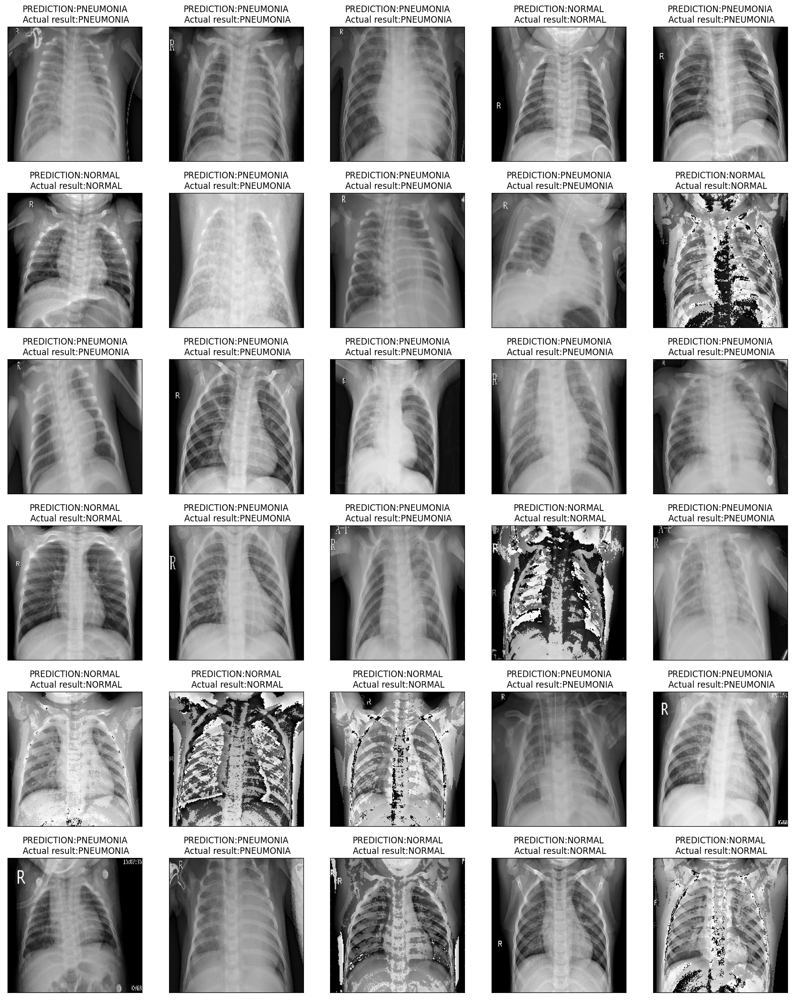

In [16]:
show_testing(test_x,test_y,sv)

# **kNN**

## Training

In [18]:
from sklearn.neighbors import KNeighborsClassifier

# train the dataset
knn_model = KNeighborsClassifier(n_neighbors=3)
knn_model.fit(xtrain, ytrain)

# Prediction
pred = knn_model.predict(xtest)

## Confusion matrix , Classification Report , ROC Curves


               precision    recall  f1-score   support

           0       0.95      0.55      0.69       863
           1       0.67      0.97      0.80       829

    accuracy                           0.75      1692
   macro avg       0.81      0.76      0.74      1692
weighted avg       0.82      0.75      0.74      1692
 
 ______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 




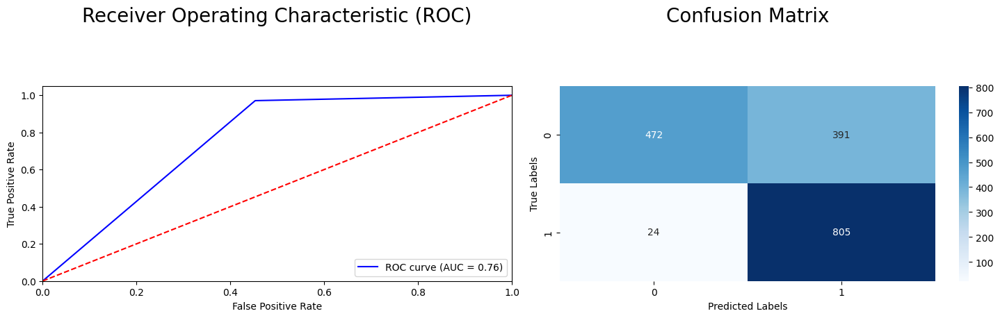

In [19]:
plot_metrics(ytest, pred)

## Visualize the proccess

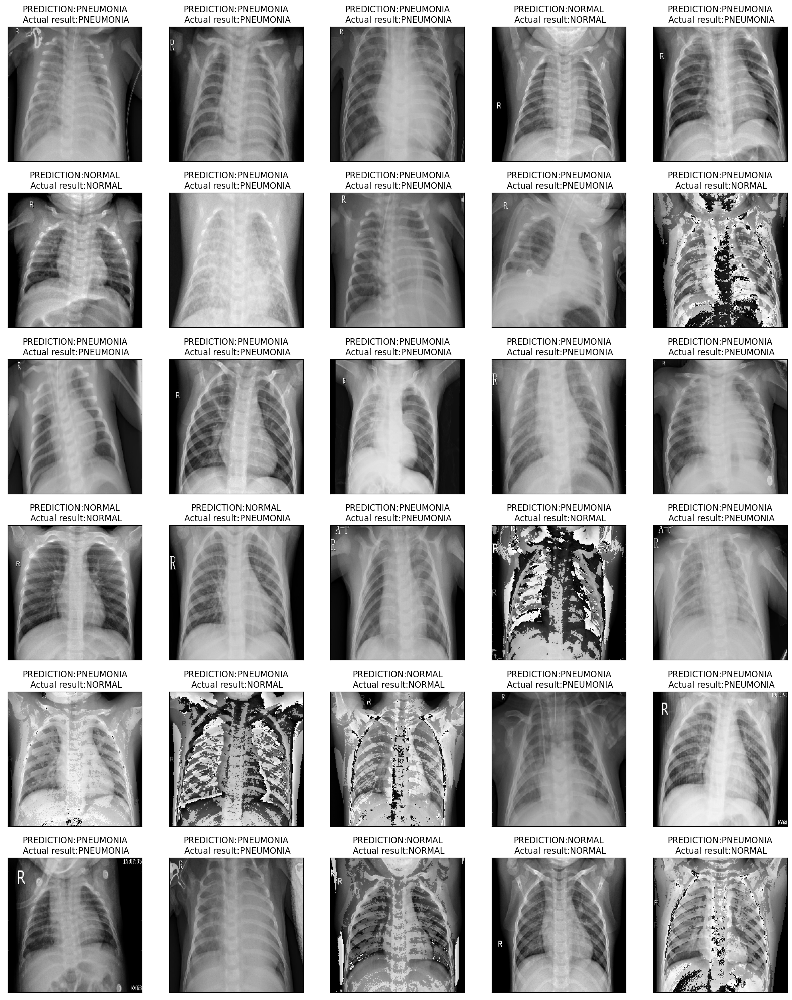

In [20]:
show_testing(test_x,test_y,knn_model)

# **Naive Bayes**

## Training and getting report

In [21]:
from sklearn.naive_bayes import GaussianNB

# train the dataset
nb_model = GaussianNB()
nb_model = nb_model.fit(xtrain, ytrain)


# Prediction
pred = nb_model.predict(xtest)

## Confusion matrix , Classification Report , ROC Curves


               precision    recall  f1-score   support

           0       0.82      0.56      0.66       863
           1       0.65      0.88      0.75       829

    accuracy                           0.71      1692
   macro avg       0.74      0.72      0.71      1692
weighted avg       0.74      0.71      0.71      1692
 
 ______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 




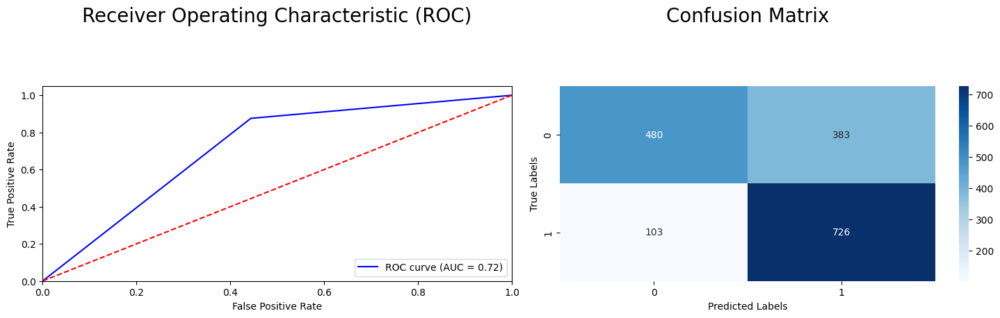

In [22]:
plot_metrics(ytest,pred)

## Visualize the proccess

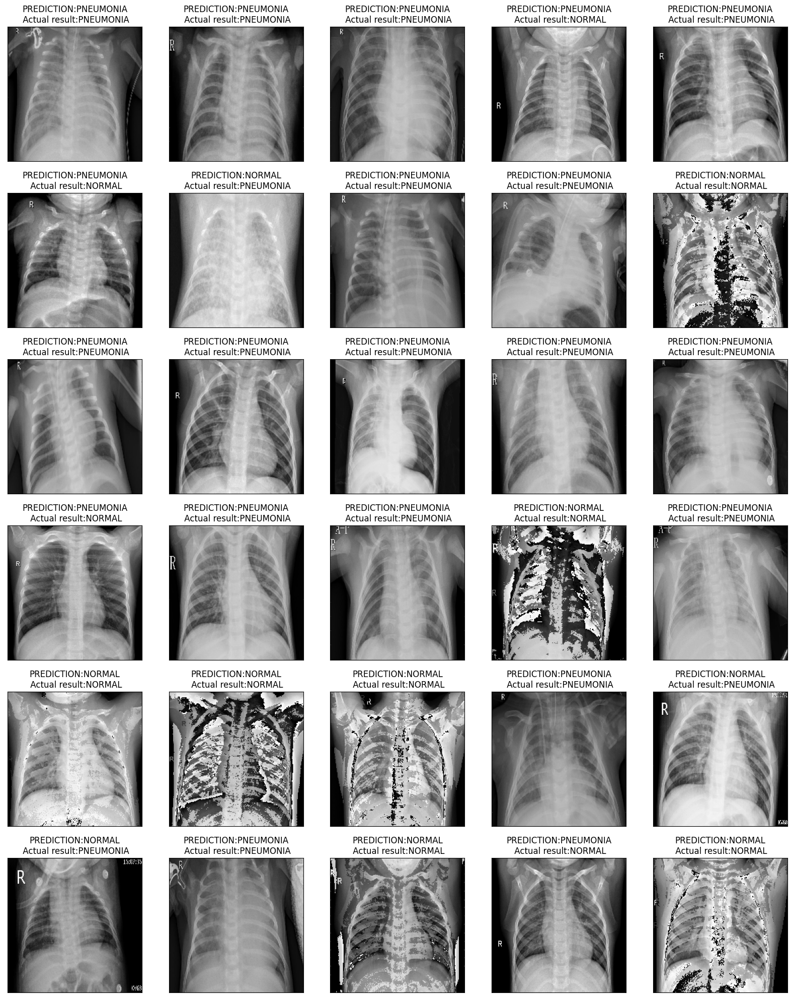

In [23]:
show_testing(test_x,test_y,nb_model)

# **Neural Networks**

## Plot function

In [11]:
def plot_history(history):
    fig, axs = plt.subplots(1, 3, figsize=(15, 4))  # Create a figure with 1 row and 3 columns

    # Plot the first graph on the first axis (axs[0])
    axs[0].plot(history.history['loss'], label='loss')
    axs[0].plot(history.history['val_loss'], label='val_loss')
    axs[0].set_xlabel('Epoch')
    axs[0].set_ylabel('Binary crossentropy')
    axs[0].grid(True)

    # Plot the second graph on the second axis (axs[1])
    axs[1].plot(history.history['accuracy'], label='accuracy')
    axs[1].plot(history.history['val_accuracy'], label='val_accuracy')
    axs[1].set_xlabel('Epoch')
    axs[1].set_ylabel('Accuracy')
    axs[1].grid(True)

    # Plot the third graph on the third axis (axs[2])
    summary = pd.DataFrame(history.history)
    summary.plot(ax=axs[2])

    plt.tight_layout()  # Adjust the spacing between subplots

    plt.show()  # Display the figure

## Train function

In [12]:
import tensorflow as tf

def train_model(X_train, y_train, num_nodes, dropout_prob, lr, batch_size, epochs):
  nn_model = tf.keras.Sequential([
      tf.keras.layers.Dense(num_nodes, activation='relu', input_shape=(None,40000)),
      tf.keras.layers.Dropout(dropout_prob),
      tf.keras.layers.Dense(num_nodes, activation='relu'),
      tf.keras.layers.Dropout(dropout_prob),
      tf.keras.layers.Dense(1, activation='sigmoid')
  ])

  nn_model.compile(optimizer=tf.keras.optimizers.Adam(lr), loss='binary_crossentropy',
                  metrics=['accuracy'])
  history = nn_model.fit(
    X_train, y_train, epochs=epochs, batch_size=batch_size, validation_split=0.2, verbose=0
  )

  return nn_model, history

## Finding best combination for least value loss by training

16 nodes, dropout 0, lr 0.01, batch size 32


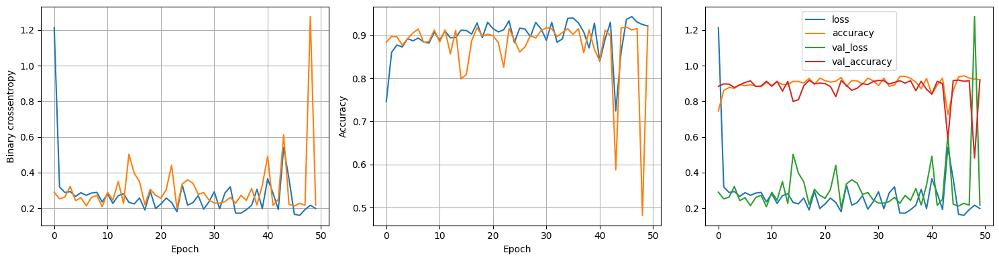

LOSS:  0.3008
ACCURACY:  0.90
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



16 nodes, dropout 0, lr 0.01, batch size 64


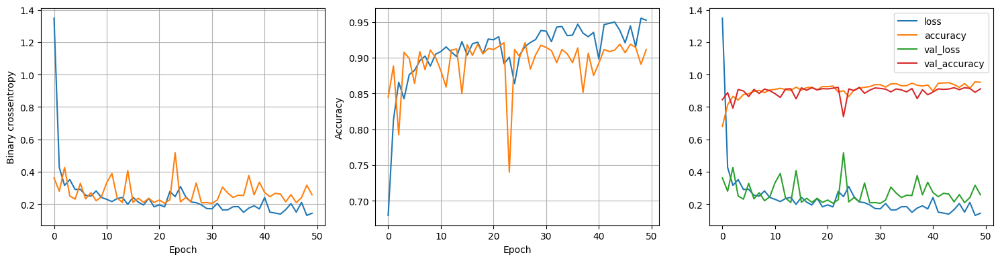

LOSS:  0.2945
ACCURACY:  0.90
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



16 nodes, dropout 0, lr 0.01, batch size 128


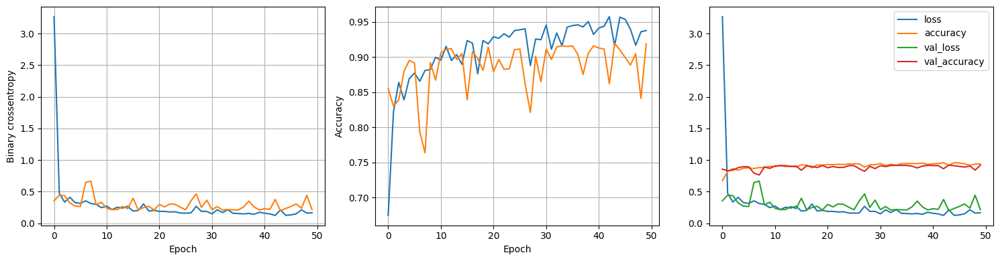

LOSS:  0.3095
ACCURACY:  0.89
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



16 nodes, dropout 0, lr 0.005, batch size 32


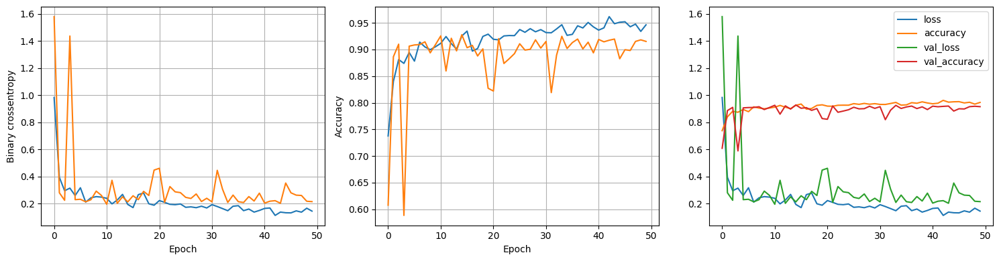

LOSS:  0.3074
ACCURACY:  0.90
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



16 nodes, dropout 0, lr 0.005, batch size 64


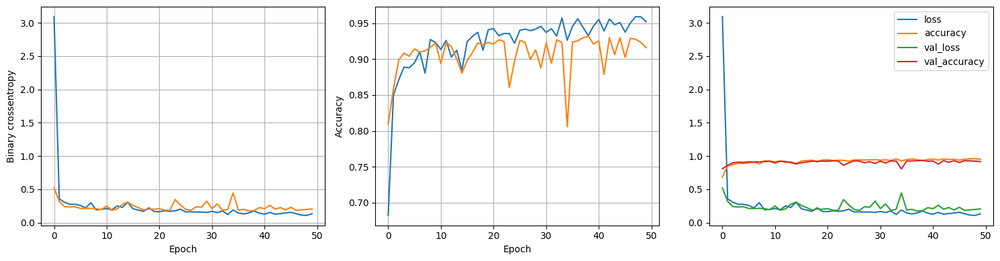

LOSS:  0.3019
ACCURACY:  0.88
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



16 nodes, dropout 0, lr 0.005, batch size 128


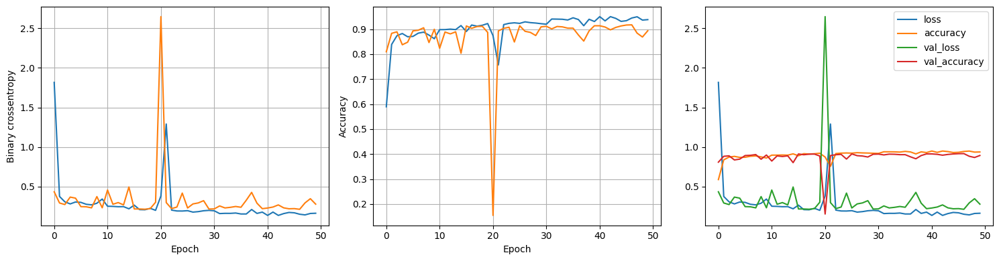

LOSS:  0.4003
ACCURACY:  0.86
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



16 nodes, dropout 0, lr 0.001, batch size 32


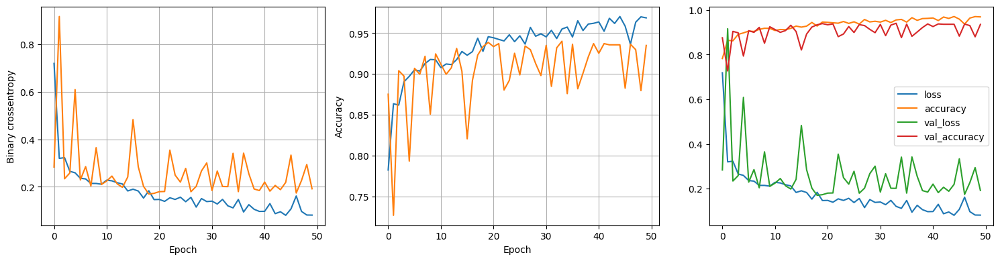

LOSS:  0.2556
ACCURACY:  0.91
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



16 nodes, dropout 0, lr 0.001, batch size 64


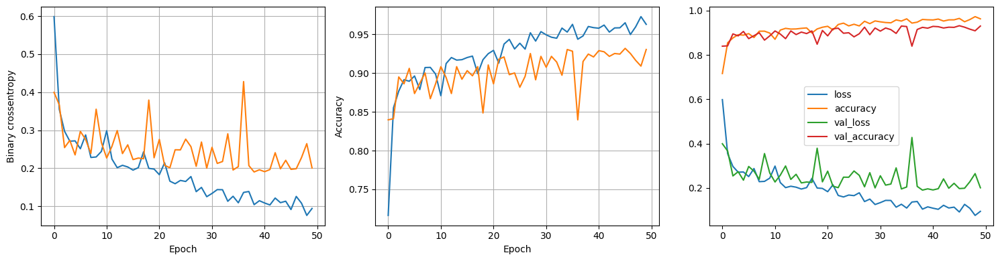

LOSS:  0.2605
ACCURACY:  0.92
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



16 nodes, dropout 0, lr 0.001, batch size 128


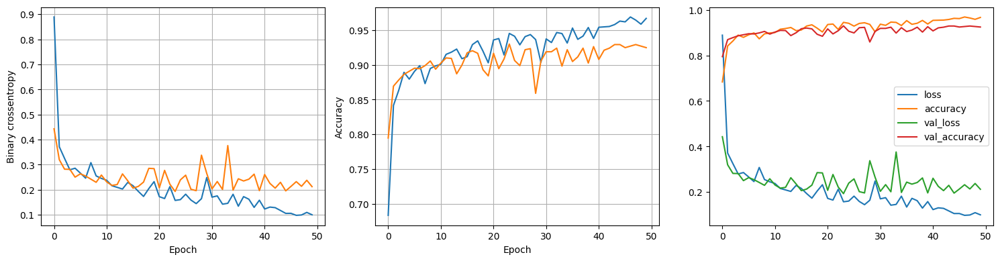

LOSS:  0.2749
ACCURACY:  0.90
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



32 nodes, dropout 0, lr 0.01, batch size 32


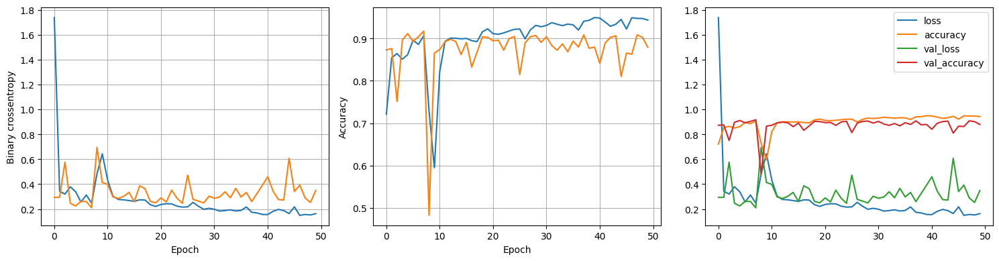

LOSS:  0.4148
ACCURACY:  0.86
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



32 nodes, dropout 0, lr 0.01, batch size 64


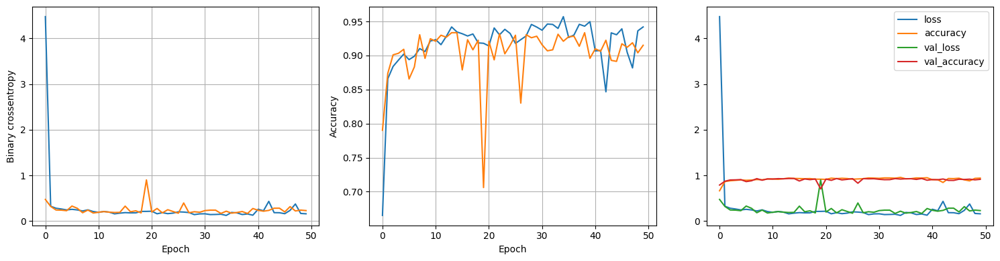

LOSS:  0.2781
ACCURACY:  0.90
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



32 nodes, dropout 0, lr 0.01, batch size 128


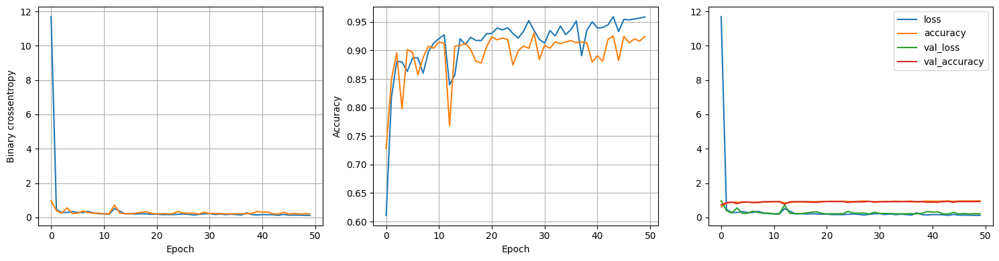

LOSS:  0.2600
ACCURACY:  0.91
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



32 nodes, dropout 0, lr 0.005, batch size 32


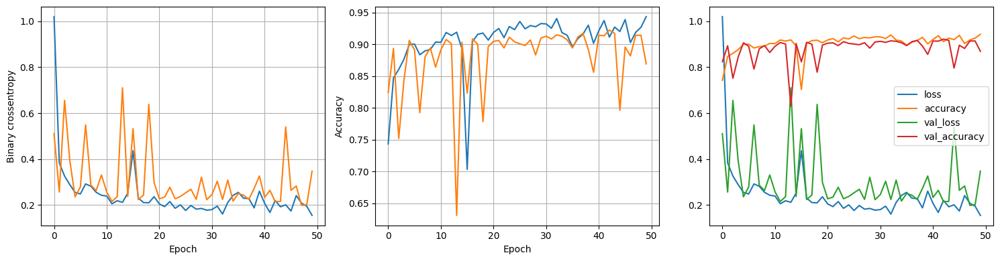

LOSS:  0.5018
ACCURACY:  0.83
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



32 nodes, dropout 0, lr 0.005, batch size 64


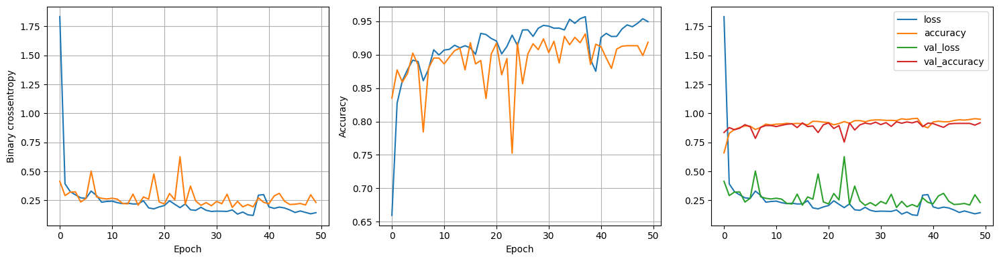

LOSS:  0.2824
ACCURACY:  0.90
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



32 nodes, dropout 0, lr 0.005, batch size 128


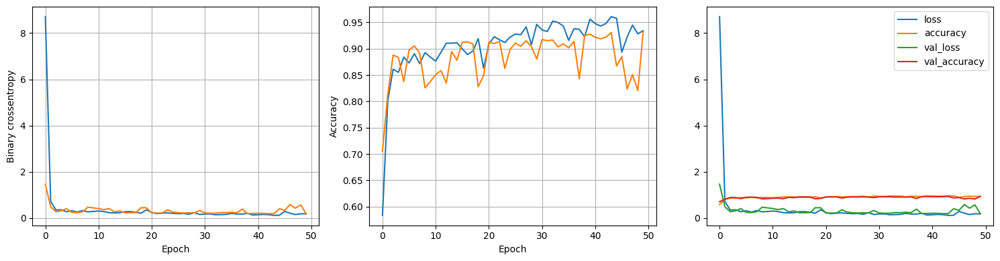

LOSS:  0.2515
ACCURACY:  0.90
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



32 nodes, dropout 0, lr 0.001, batch size 32


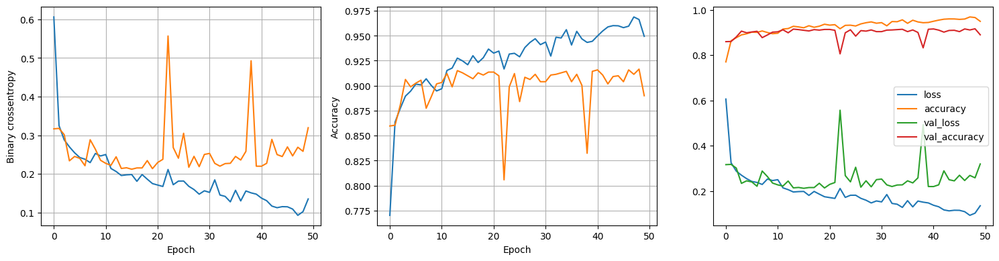

LOSS:  0.3760
ACCURACY:  0.88
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



32 nodes, dropout 0, lr 0.001, batch size 64


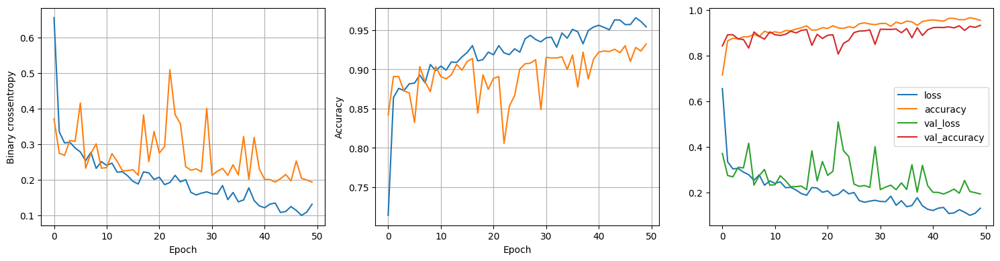

LOSS:  0.2586
ACCURACY:  0.92
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



32 nodes, dropout 0, lr 0.001, batch size 128


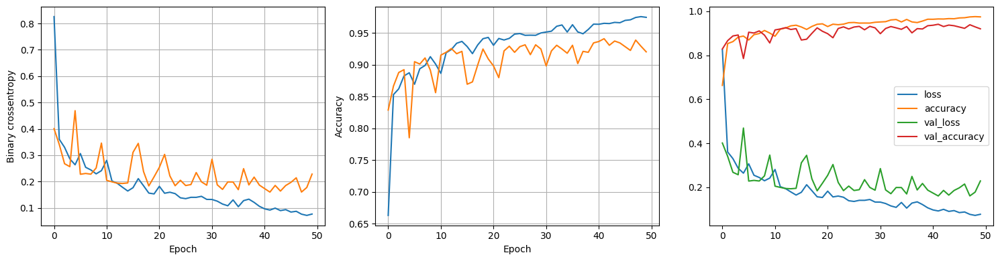

LOSS:  0.2546
ACCURACY:  0.91
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



64 nodes, dropout 0, lr 0.01, batch size 32


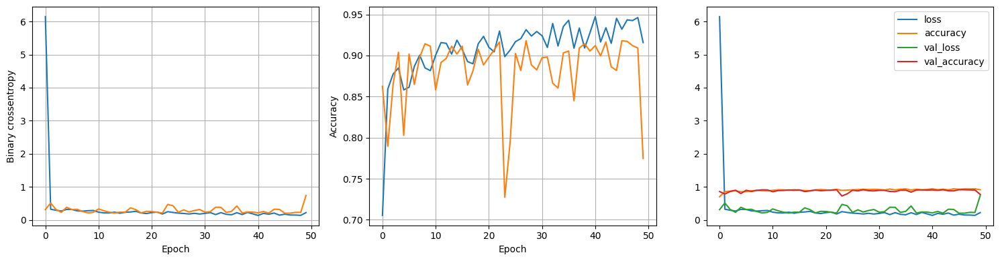

LOSS:  0.9854
ACCURACY:  0.73
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



64 nodes, dropout 0, lr 0.01, batch size 64


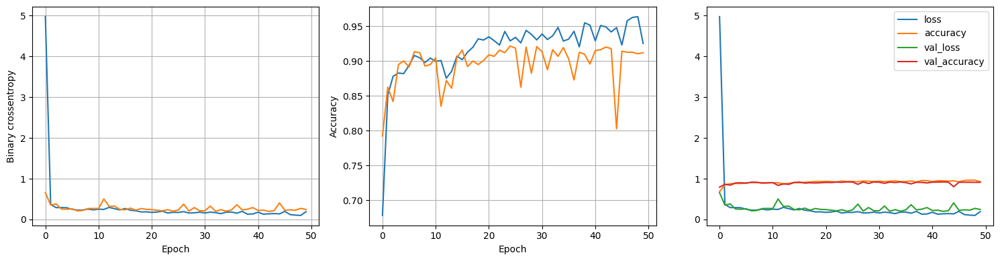

LOSS:  0.3588
ACCURACY:  0.89
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



64 nodes, dropout 0, lr 0.01, batch size 128


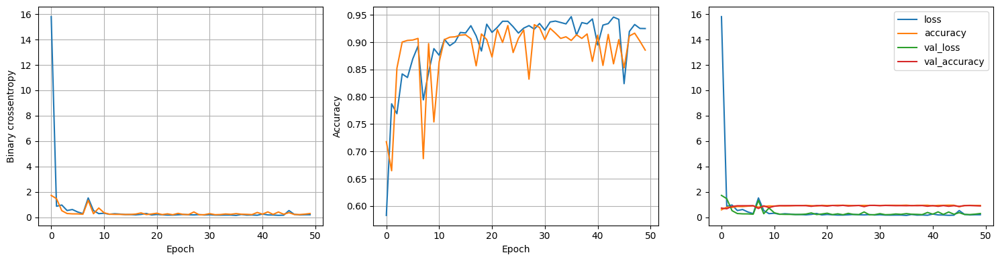

LOSS:  0.4120
ACCURACY:  0.85
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



64 nodes, dropout 0, lr 0.005, batch size 32


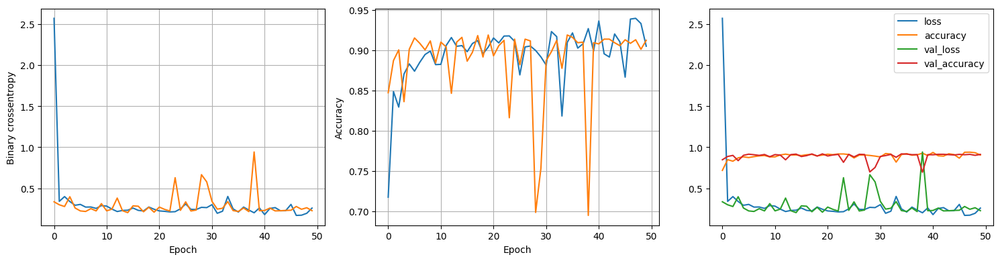

LOSS:  0.3088
ACCURACY:  0.89
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



64 nodes, dropout 0, lr 0.005, batch size 64


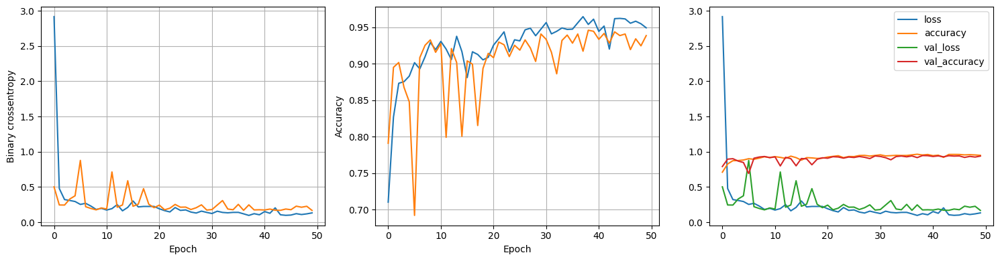

LOSS:  0.2061
ACCURACY:  0.92
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



64 nodes, dropout 0, lr 0.005, batch size 128


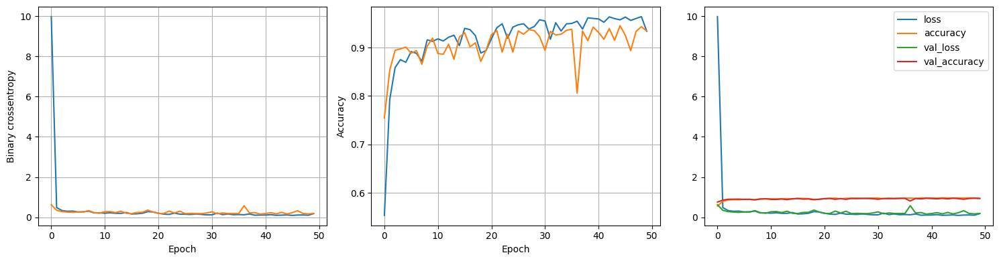

LOSS:  0.2321
ACCURACY:  0.93
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



64 nodes, dropout 0, lr 0.001, batch size 32


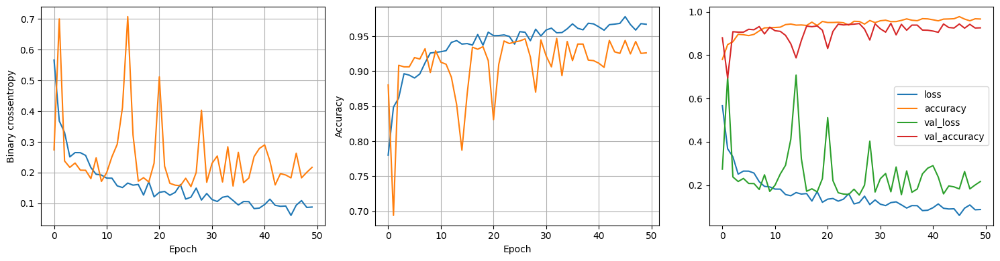

LOSS:  0.2936
ACCURACY:  0.90
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



64 nodes, dropout 0, lr 0.001, batch size 64


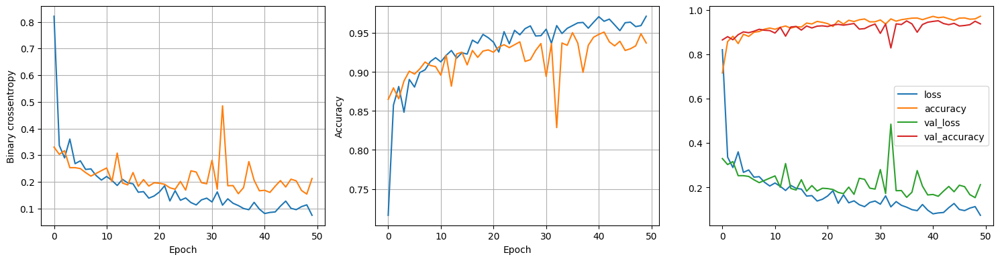

LOSS:  0.2578
ACCURACY:  0.92
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



64 nodes, dropout 0, lr 0.001, batch size 128


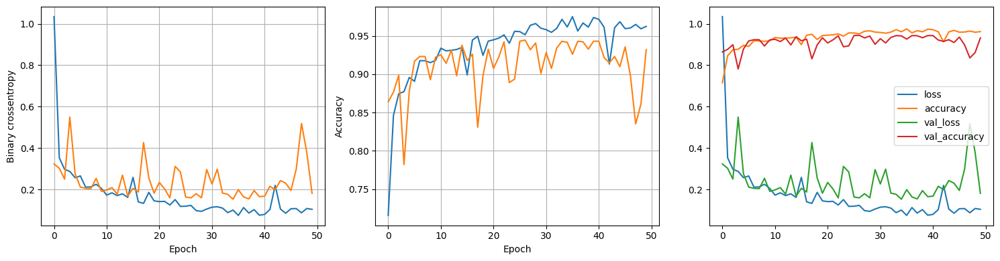

LOSS:  0.2624
ACCURACY:  0.90
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 





In [13]:
least_val_loss = float('inf')
least_loss_model = None
epochs=50
dropout_prob = 0
for num_nodes in [16, 32, 64]:
    for lr in [0.01, 0.005, 0.001]:
      for batch_size in [32, 64, 128]:
        print(f"{num_nodes} nodes, dropout {dropout_prob}, lr {lr}, batch size {batch_size}")
        model, history = train_model(xtrain, ytrain, num_nodes, dropout_prob, lr, batch_size, epochs)
        plot_history(history)
       
        results = model.evaluate(xtest, ytest,verbose=0)
        print("LOSS:  " + "%.4f" % results[0])
        print("ACCURACY:  " + "%.2f" % results[1])
        val_loss = results[0]
        print("_"*230,'\n\n\n')
        if val_loss < least_val_loss:
          least_val_loss = val_loss
          least_loss_model = model

In [14]:
Model_Results = least_loss_model.evaluate(xtest,ytest)
print("LOSS:  " + "%.4f" % Model_Results[0])
print("ACCURACY:  " + "%.2f" % Model_Results[1])

53/53 [==============================] - 0s 5ms/step - loss: 0.2061 - accuracy: 0.9208
LOSS:  0.2061
ACCURACY:  0.92


## Confusion matrix , Classification Report , ROC Curves

53/53 [==============================] - 0s 5ms/step

               precision    recall  f1-score   support

           0       0.96      0.89      0.92       891
           1       0.88      0.96      0.92       801

    accuracy                           0.92      1692
   macro avg       0.92      0.92      0.92      1692
weighted avg       0.92      0.92      0.92      1692
 
 ______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 




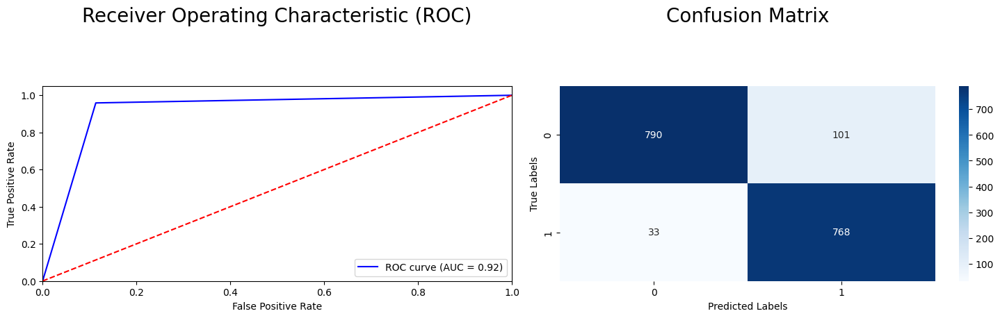

In [15]:
y_pred = least_loss_model.predict(xtest)
y_pred = (y_pred > 0.5).astype(int).reshape(-1,)
plot_metrics(ytest, y_pred)

## Visualize the proccess

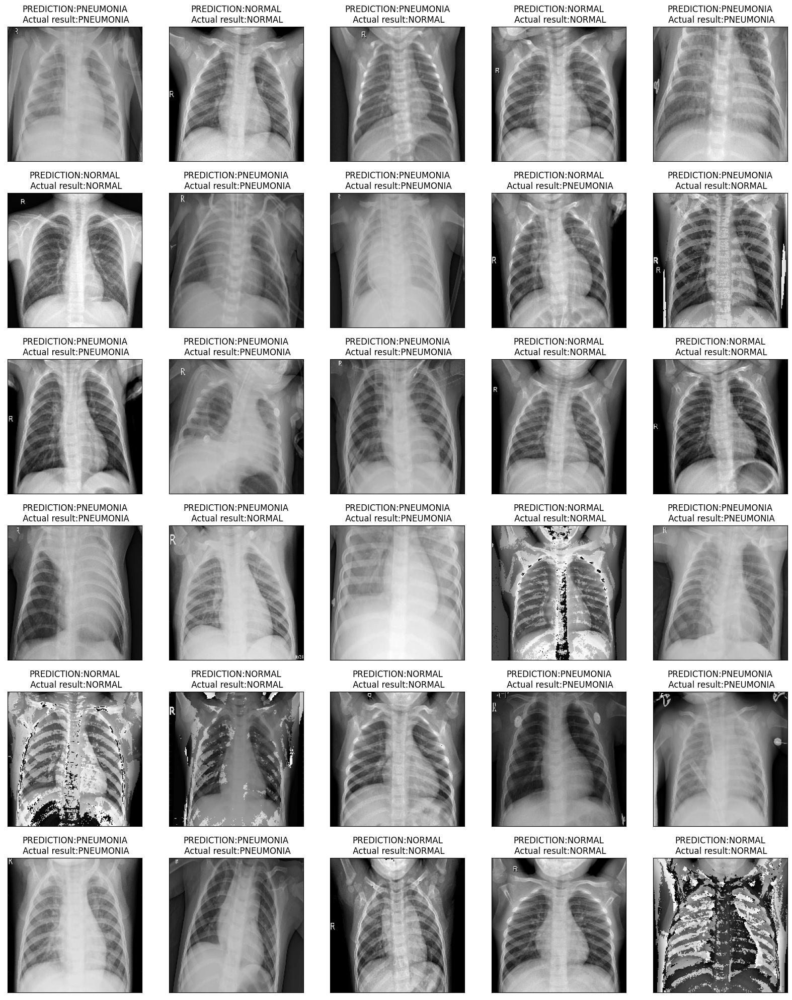

In [16]:
fig, axes = plt.subplots(nrows=6,
                         ncols=5,
                         figsize=(20, 25),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):   
       img = test_x[i].reshape(1,-1)/255
       p = (least_loss_model.predict(img,verbose = 0)> 0.5).astype(int)
       ax.imshow(test_x[i],cmap='gray')
       ax.set_title(f"PREDICTION:{class_names[p[0][0]]}\n Actual result:{class_names[test_y[i]]}")

# **Random Forest**

## Training

In [17]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(xtrain, ytrain)

y_pred = rf.predict(xtest)

## Confusion matrix , Classification Report , ROC Curves


               precision    recall  f1-score   support

           0       0.95      0.96      0.96       891
           1       0.96      0.94      0.95       801

    accuracy                           0.95      1692
   macro avg       0.95      0.95      0.95      1692
weighted avg       0.95      0.95      0.95      1692
 
 ______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 




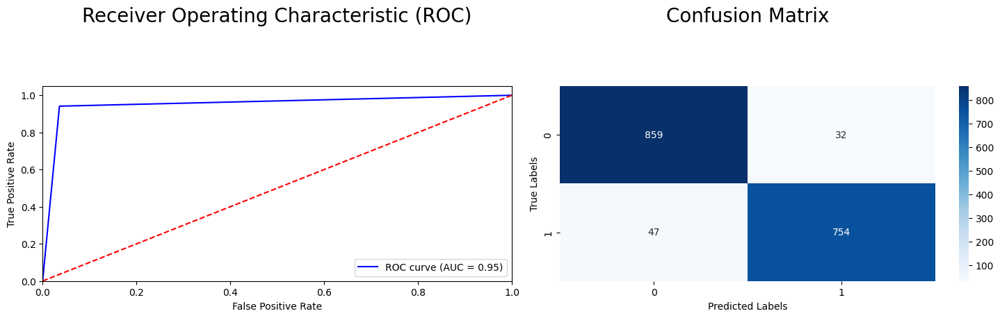

In [18]:
plot_metrics(ytest,y_pred)

## Visualize the proccess

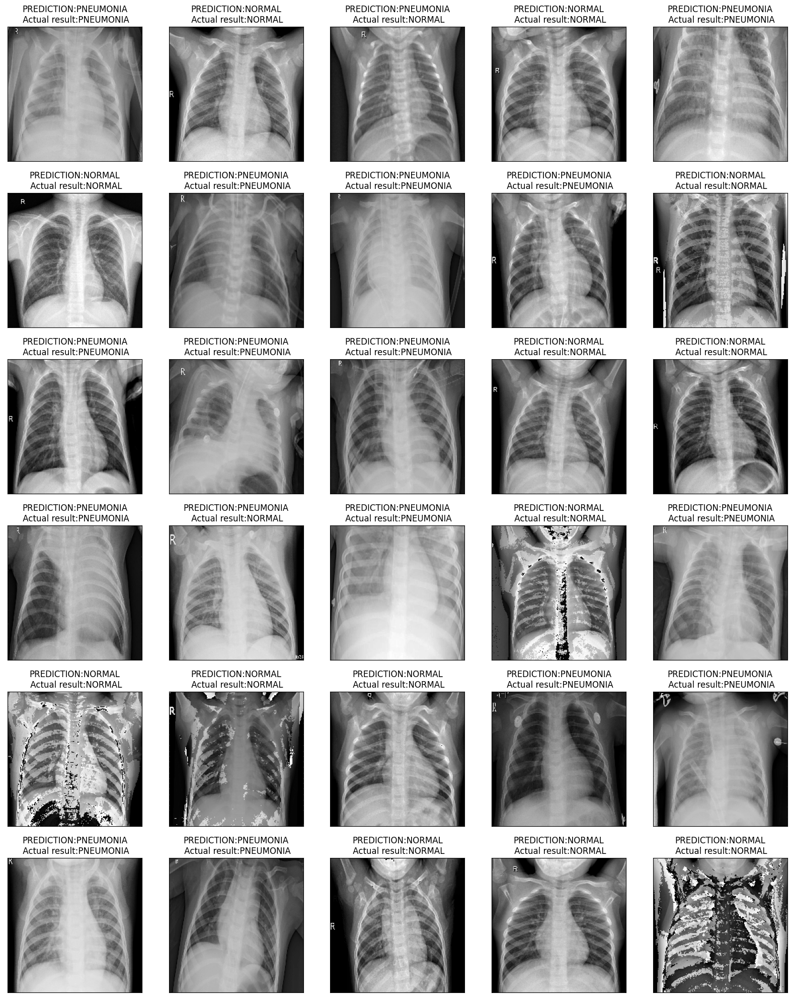

In [19]:
show_testing(test_x,test_y,rf)

# **K-means clustering**

## Training

In [20]:
from sklearn.cluster import KMeans


# Scaling the dataset (but here we use all the dataset not only train)
scaler = preprocessing.MinMaxScaler()
data_x = scaler.fit_transform(data_x_updated)

k = 2  # Number of clusters (normal and tumor)
kmeans = KMeans(n_clusters=k, random_state=42)
kmeans.fit(data_x)

y_pred = kmeans.labels_

## Confusion matrix , Classification Report , ROC Curves


               precision    recall  f1-score   support

           0       0.46      0.52      0.49      4226
           1       0.46      0.41      0.43      4234

    accuracy                           0.46      8460
   macro avg       0.46      0.46      0.46      8460
weighted avg       0.46      0.46      0.46      8460
 
 ______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 




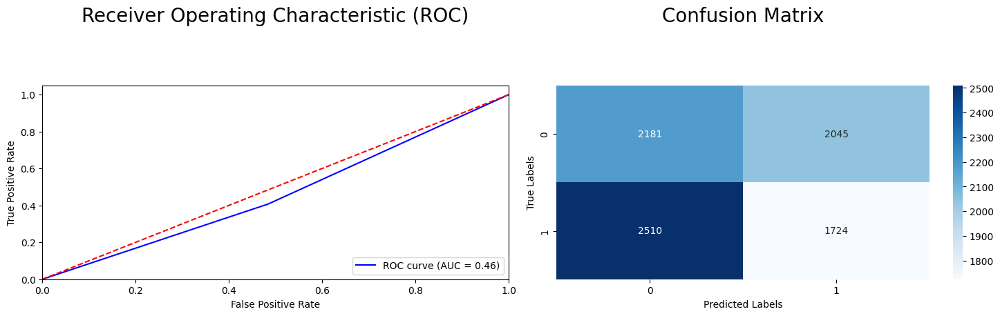

In [21]:
plot_metrics(data_y,y_pred)